<a href="https://colab.research.google.com/github/mrshahabian/OpenCV/blob/main/firstmodel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://learnopencv.com/introduction-to-video-classification-and-human-activity-recognition/?ck_subscriber_id=515314147





In [1]:
!pip install pafy
!pip install youtube-dl

     |████████████████████████████████| 1.9MB 7.8MB/s 


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!pip install tools

In [2]:
import os
import cv2
import math
import pafy
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from moviepy.editor import *
from collections import deque
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)3473408/45929032 bytes (7.6%)7471104/45929032 bytes (16.3%)11427840/45929032 bytes (24.9%)15613952/45929032 bytes (34.0%)19603456/45929032 bytes (42.7%)23748608/45929032 bytes (51.7%)27574272/45929032 bytes (60.0%)31596544/45929032 bytes (68.8%)35667968/45929032 bytes (77.7%)39755776/45929032 bytes (86.6%)43843584/45929032 bytes (95.5%)45929032/45929032 bytes (100.0%)
  Done
File saved as /root

In [20]:
seed_constant = 23
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

# New section

In [3]:
!wget -nc --no-check-certificate https://www.crcv.ucf.edu/data/UCF50.rar
!unrar x UCF50.rar -inul -y

--2021-04-01 13:23:27--  https://www.crcv.ucf.edu/data/UCF50.rar
Resolving www.crcv.ucf.edu (www.crcv.ucf.edu)... 132.170.214.127
Connecting to www.crcv.ucf.edu (www.crcv.ucf.edu)|132.170.214.127|:443... connected.
  Unable to locally verify the issuer's authority.
HTTP request sent, awaiting response... 200 OK
Length: 3233554570 (3.0G) [application/rar]
Saving to: ‘UCF50.rar’

UCF50.rar           100%[===================>]   3.01G  40.6MB/s    in 84s     

2021-04-01 13:24:51 (36.7 MB/s) - ‘UCF50.rar’ saved [3233554570/3233554570]



In [5]:
ls

sample_data/  UCF50/  UCF50.rar


['SalsaSpin', 'Diving', 'Mixing', 'Swing', 'JavelinThrow', 'PullUps', 'SkateBoarding', 'PlayingPiano', 'JumpingJack', 'Lunges', 'HulaHoop', 'Punch', 'BenchPress', 'TrampolineJumping', 'JugglingBalls', 'PlayingTabla', 'Kayaking', 'CleanAndJerk', 'ThrowDiscus', 'GolfSwing', 'Biking', 'Drumming', 'Rowing', 'PlayingGuitar', 'PoleVault', 'PlayingViolin', 'TaiChi', 'PizzaTossing', 'SoccerJuggling', 'Nunchucks', 'Basketball', 'Billiards', 'BreastStroke', 'MilitaryParade', 'TennisSwing', 'RopeClimbing', 'HighJump', 'PommelHorse', 'RockClimbingIndoor', 'HorseRiding', 'HorseRace', 'JumpRope', 'WalkingWithDog', 'Skijet', 'PushUps', 'YoYo', 'BaseballPitch', 'Skiing', 'VolleyballSpiking', 'Fencing']


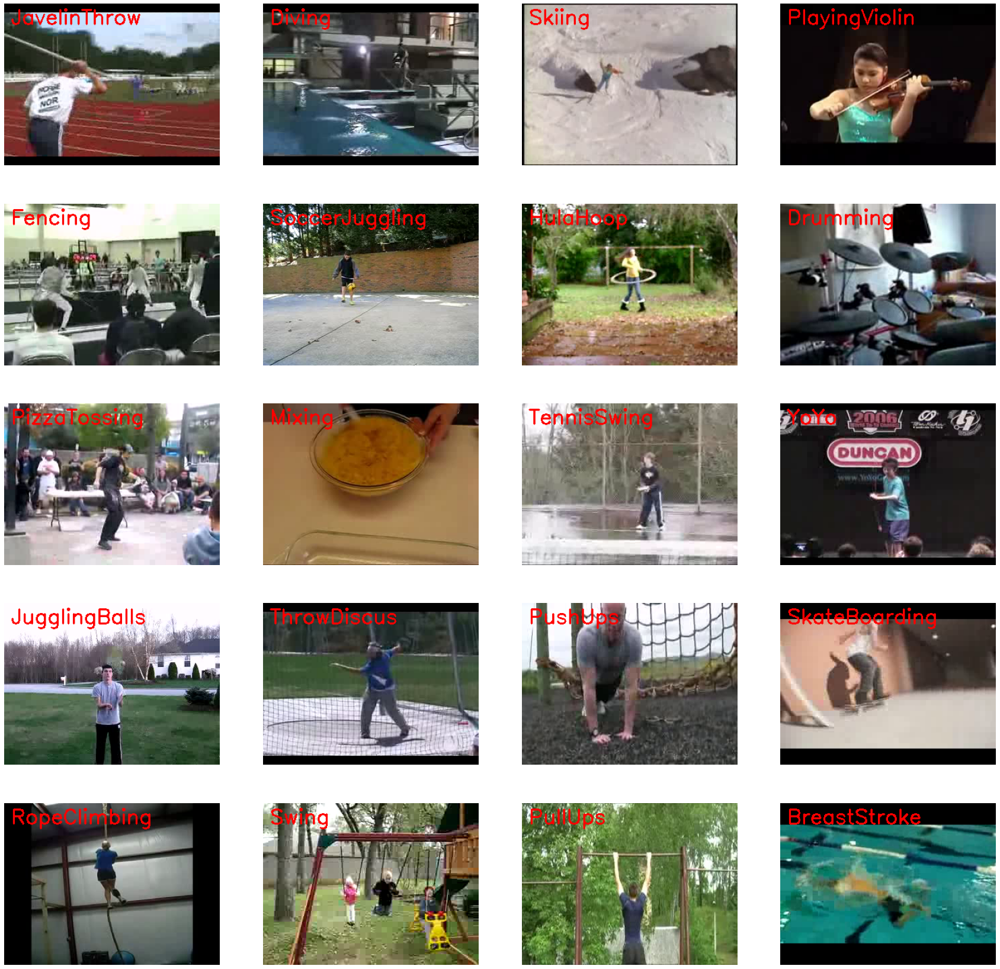

In [6]:
# Create a Matplotlib figure
plt.figure(figsize = (30, 30))

# Get Names of all classes in UCF50
all_classes_names = os.listdir('UCF50')

print(all_classes_names)

# Generate a random sample of images each time the cell runs
random_range = random.sample(range(len(all_classes_names)), 20)

# Iterating through all the random samples
for counter, random_index in enumerate(random_range, 1):

    # Getting Class Name using Random Index
    selected_class_Name = all_classes_names[random_index]

    # Getting a list of all the video files present in a Class Directory
    video_files_names_list = os.listdir(f'UCF50/{selected_class_Name}')

    # Randomly selecting a video file
    selected_video_file_name = random.choice(video_files_names_list)

    # Reading the Video File Using the Video Capture
    video_reader = cv2.VideoCapture(f'UCF50/{selected_class_Name}/{selected_video_file_name}')
    
    # Reading The First Frame of the Video File
    _, bgr_frame = video_reader.read()

    # Closing the VideoCapture object and releasing all resources. 
    video_reader.release()

    # Converting the BGR Frame to RGB Frame 
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)

    # Adding The Class Name Text on top of the Video Frame.
    cv2.putText(rgb_frame, selected_class_Name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
    
    # Assigning the Frame to a specific position of a subplot
    plt.subplot(5, 4, counter)
    plt.imshow(rgb_frame)
    plt.axis('off')


In [7]:
image_height, image_width = 64, 64
max_images_per_class = 8000

dataset_directory = "UCF50"
classes_list = ["WalkingWithDog", "TaiChi", "Swing", "HorseRace"]

model_output_size = len(classes_list)


In [21]:
def frames_extraction(video_path):
    # Empty List declared to store video frames
    frames_list = []
    
    # Reading the Video File Using the VideoCapture
    video_reader = cv2.VideoCapture(video_path)

    # Iterating through Video Frames
    while True:

        # Reading a frame from the video file 
        success, frame = video_reader.read() 

        # If Video frame was not successfully read then break the loop
        if not success:
            break

        # Resize the Frame to fixed Dimensions
        resized_frame = cv2.resize(frame, (image_height, image_width))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255
        
        # Appending the normalized frame into the frames list
        frames_list.append(normalized_frame)
    
    # Closing the VideoCapture object and releasing all resources. 
    video_reader.release()

    # returning the frames list 
    return frames_list


In [15]:
features, labels = create_dataset()

Extracting Data of Class: WalkingWithDog
['v_WalkingWithDog_g10_c02.avi', 'v_WalkingWithDog_g08_c04.avi', 'v_WalkingWithDog_g11_c03.avi', 'v_WalkingWithDog_g24_c03.avi', 'v_WalkingWithDog_g11_c01.avi', 'v_WalkingWithDog_g03_c04.avi', 'v_WalkingWithDog_g15_c03.avi', 'v_WalkingWithDog_g11_c04.avi', 'v_WalkingWithDog_g04_c04.avi', 'v_WalkingWithDog_g23_c01.avi', 'v_WalkingWithDog_g23_c04.avi', 'v_WalkingWithDog_g02_c06.avi', 'v_WalkingWithDog_g21_c03.avi', 'v_WalkingWithDog_g03_c05.avi', 'v_WalkingWithDog_g06_c05.avi', 'v_WalkingWithDog_g06_c03.avi', 'v_WalkingWithDog_g17_c03.avi', 'v_WalkingWithDog_g09_c06.avi', 'v_WalkingWithDog_g22_c02.avi', 'v_WalkingWithDog_g02_c01.avi', 'v_WalkingWithDog_g05_c04.avi', 'v_WalkingWithDog_g02_c03.avi', 'v_WalkingWithDog_g13_c04.avi', 'v_WalkingWithDog_g20_c06.avi', 'v_WalkingWithDog_g13_c05.avi', 'v_WalkingWithDog_g02_c02.avi', 'v_WalkingWithDog_g09_c01.avi', 'v_WalkingWithDog_g24_c06.avi', 'v_WalkingWithDog_g06_c02.avi', 'v_WalkingWithDog_g25_c03.avi'

In [22]:
# Using Keras's to_categorical method to convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)

In [24]:
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.2, shuffle = True, random_state = seed_constant)

In [25]:
# Let's create a function that will construct our model
def create_model():

    # We will use a Sequential model for model construction
    model = Sequential()

    # Defining The Model Architecture
    model.add(Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu', input_shape = (image_height, image_width, 3)))
    model.add(Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size = (2, 2)))
    model.add(GlobalAveragePooling2D())
    model.add(Dense(256, activation = 'relu'))
    model.add(BatchNormalization())
    model.add(Dense(model_output_size, activation = 'softmax'))

    # Printing the models summary
    model.summary()

    return model


# Calling the create_model method
model = create_model()

print("Model Created Successfully!")


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 62, 62, 64)        1792      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 60, 60, 64)        36928     
_________________________________________________________________
batch_normalization (BatchNo (None, 60, 60, 64)        256       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 30, 30, 64)        0         
_________________________________________________________________
global_average_pooling2d (Gl (None, 64)                0         
_________________________________________________________________
dense (Dense)                (None, 256)               16640     
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1

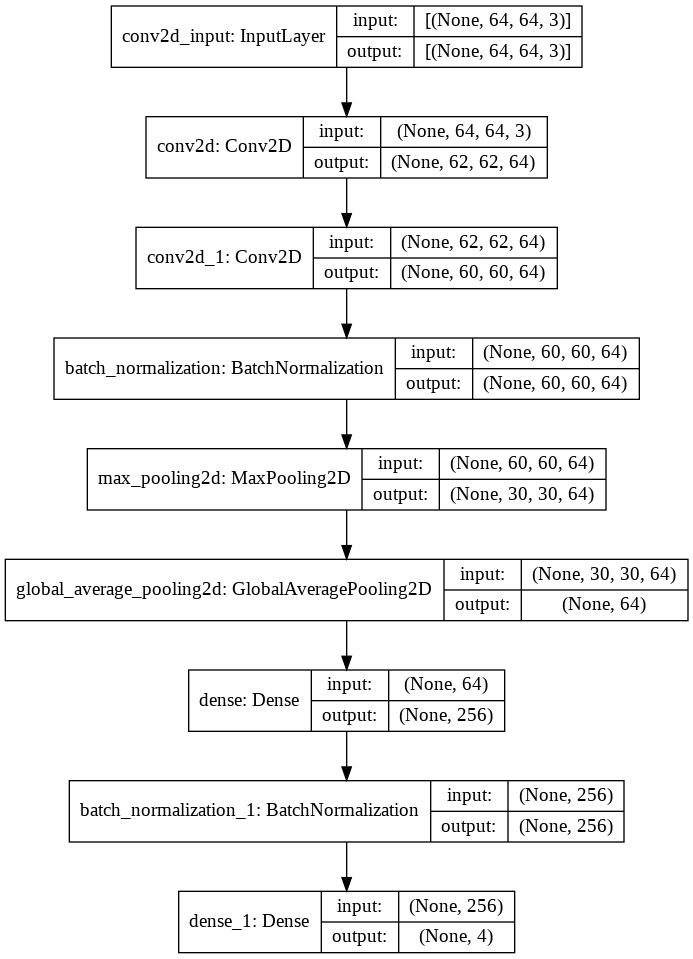

In [26]:
plot_model(model, to_file = 'model_structure_plot.png', show_shapes = True, show_layer_names = True)

In [27]:
# Adding Early Stopping Callback
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = 'min', restore_best_weights = True)

# Adding loss, optimizer and metrics values to the model.
model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

# Start Training
model_training_history = model.fit(x = features_train, y = labels_train, epochs = 50, batch_size = 4 , shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback])


Epoch 1/50
5120/5120 [==============================] - 52s 4ms/step - loss: 1.0236 - accuracy: 0.5708 - val_loss: 0.5422 - val_accuracy: 0.8293
Epoch 2/50
5120/5120 [==============================] - 19s 4ms/step - loss: 0.5802 - accuracy: 0.7838 - val_loss: 0.2581 - val_accuracy: 0.9182
Epoch 3/50
5120/5120 [==============================] - 19s 4ms/step - loss: 0.4121 - accuracy: 0.8548 - val_loss: 0.1868 - val_accuracy: 0.9541
Epoch 4/50
5120/5120 [==============================] - 19s 4ms/step - loss: 0.3228 - accuracy: 0.8872 - val_loss: 0.2120 - val_accuracy: 0.9428
Epoch 5/50
5120/5120 [==============================] - 19s 4ms/step - loss: 0.2851 - accuracy: 0.9026 - val_loss: 0.3839 - val_accuracy: 0.8885
Epoch 6/50
5120/5120 [==============================] - 19s 4ms/step - loss: 0.2452 - accuracy: 0.9154 - val_loss: 0.2503 - val_accuracy: 0.9172
Epoch 7/50
5120/5120 [==============================] - 19s 4ms/step - loss: 0.2388 - accuracy: 0.9208 - val_loss: 0.0793 - val_ac

In [31]:
model_evaluation_history = model.evaluate(features_test, labels_test)


200/200 [==============================] - 1s 5ms/step - loss: 0.0733 - accuracy: 0.9861


In [32]:
# Creating a useful name for our model, incase you're saving multiple models (OPTIONAL)
date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history
model_name = f'Model___Date_Time_{current_date_time_string}___Loss_ {model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'

# Saving your Model
model.save(model_name)


In [33]:
ls

'Model___Date_Time_2021_04_01__13_59_58___Loss_ 0.07334256917238235___Accuracy_0.9860937595367432.h5'
'Model___Date_Time_2021_04_01__14_00_12___Loss_ 0.07334256917238235___Accuracy_0.9860937595367432.h5'
 model_structure_plot.png
 sample_data/
 UCF50/
 UCF50.rar


In [34]:
def plot_metric(metric_name_1, metric_name_2, plot_name):
  # Get Metric values using metric names as identifiers
  metric_value_1 = model_training_history.history[metric_name_1]
  metric_value_2 = model_training_history.history[metric_name_2]

  # Constructing a range object which will be used as time 
  epochs = range(len(metric_value_1))
  
  # Plotting the Graph
  plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
  plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)
  
  # Adding title to the plot
  plt.title(str(plot_name))

  # Adding legend to the plot
  plt.legend()


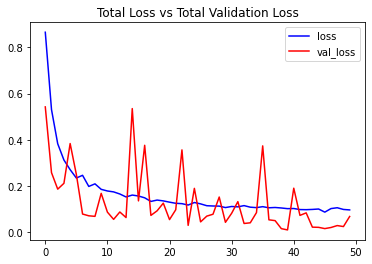

In [35]:
plot_metric('loss', 'val_loss', 'Total Loss vs Total Validation Loss')

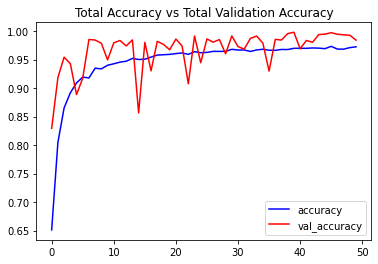

In [36]:
plot_metric('accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')


In [37]:
def download_youtube_videos(youtube_video_url, output_directory):
    # Creating a Video object which includes useful information regarding the youtube video.
    video = pafy.new(youtube_video_url)

    # Getting the best available quality object for the youtube video.
    video_best = video.getbest()

    # Constructing the Output File Path
    output_file_path = f'{output_directory}/{video.title}.mp4'

    # Downloading the youtube video at the best available quality.
    video_best.download(filepath = output_file_path, quiet = True)

    # Returning Video Title
    return video.title


In [38]:
def predict_on_live_video(video_file_path, output_file_path, window_size):

    # Initialize a Deque Object with a fixed size which will be used to implement moving/rolling average functionality.
    predicted_labels_probabilities_deque = deque(maxlen = window_size)

    # Reading the Video File using the VideoCapture Object
    video_reader = cv2.VideoCapture(video_file_path)

    # Getting the width and height of the video 
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Writing the Overlayed Video Files Using the VideoWriter Object
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'), 24, (original_video_width, original_video_height))

    while True: 

        # Reading The Frame
        status, frame = video_reader.read() 

        if not status:
            break

        # Resize the Frame to fixed Dimensions
        resized_frame = cv2.resize(frame, (image_height, image_width))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255

        # Passing the Image Normalized Frame to the model and receiving Predicted Probabilities.
        predicted_labels_probabilities = model.predict(np.expand_dims(normalized_frame, axis = 0))[0]

        # Appending predicted label probabilities to the deque object
        predicted_labels_probabilities_deque.append(predicted_labels_probabilities)

        # Assuring that the Deque is completely filled before starting the averaging process
        if len(predicted_labels_probabilities_deque) == window_size:

            # Converting Predicted Labels Probabilities Deque into Numpy array
            predicted_labels_probabilities_np = np.array(predicted_labels_probabilities_deque)

            # Calculating Average of Predicted Labels Probabilities Column Wise 
            predicted_labels_probabilities_averaged = predicted_labels_probabilities_np.mean(axis = 0)

            # Converting the predicted probabilities into labels by returning the index of the maximum value.
            predicted_label = np.argmax(predicted_labels_probabilities_averaged)

            # Accessing The Class Name using predicted label.
            predicted_class_name = classes_list[predicted_label]
          
            # Overlaying Class Name Text Ontop of the Frame
            cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

        # Writing The Frame
        video_writer.write(frame)


        # cv2.imshow('Predicted Frames', frame)

        # key_pressed = cv2.waitKey(10)

        # if key_pressed == ord('q'):
        #     break

    # cv2.destroyAllWindows()

    
    # Closing the VideoCapture and VideoWriter objects and releasing all resources held by them. 
    video_reader.release()
    video_writer.release()


In [39]:
# Creating The Output directories if it does not exist
output_directory = 'Youtube_Videos'
os.makedirs(output_directory, exist_ok = True)

# Downloading a YouTube Video
video_title = download_youtube_videos('https://www.youtube.com/watch?v=8u0qjmHIOcE', output_directory)

# Getting the YouTube Video's path you just downloaded
input_video_file_path = f'{output_directory}/{video_title}.mp4'


In [40]:
# Setting sthe Window Size which will be used by the Rolling Average Proces
window_size = 1

# Constructing The Output YouTube Video Path
output_video_file_path = f'{output_directory}/{video_title} -Output-WSize {window_size}.mp4'

# Calling the predict_on_live_video method to start the Prediction.
predict_on_live_video(input_video_file_path, output_video_file_path, window_size)

# Play Video File in the Notebook
VideoFileClip(output_video_file_path).ipython_display(width = 700)


100%|██████████| 866/866 [00:01<00:00, 736.05it/s]


In [28]:
# Setting the Window Size which will be used by the Rolling Average Process
window_size = 25

# Constructing The Output YouTube Video Path
output_video_file_path = f'{output_directory}/{video_title} -Output-WSize {window_size}.mp4'

# Calling the predict_on_live_video method to start the Prediction and Rolling Average Process
predict_on_live_video(input_video_file_path, output_video_file_path, window_size)

# Play Video File in the Notebook
VideoFileClip(output_video_file_path).ipython_display(width = 700)


100%|██████████| 866/866 [00:01<00:00, 773.20it/s]


In [41]:
def make_average_predictions(video_file_path, predictions_frames_count):
    
    # Initializing the Numpy array which will store Prediction Probabilities
    predicted_labels_probabilities_np = np.zeros((predictions_frames_count, model_output_size), dtype = np.float)

    # Reading the Video File using the VideoCapture Object
    video_reader = cv2.VideoCapture(video_file_path)

    # Getting The Total Frames present in the video 
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculating The Number of Frames to skip Before reading a frame
    skip_frames_window = video_frames_count // predictions_frames_count

    for frame_counter in range(predictions_frames_count): 

        # Setting Frame Position
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Reading The Frame
        _ , frame = video_reader.read() 

        # Resize the Frame to fixed Dimensions
        resized_frame = cv2.resize(frame, (image_height, image_width))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255

        # Passing the Image Normalized Frame to the model and receiving Predicted Probabilities.
        predicted_labels_probabilities = model.predict(np.expand_dims(normalized_frame, axis = 0))[0]

        # Appending predicted label probabilities to the deque object
        predicted_labels_probabilities_np[frame_counter] = predicted_labels_probabilities

    # Calculating Average of Predicted Labels Probabilities Column Wise 
    predicted_labels_probabilities_averaged = predicted_labels_probabilities_np.mean(axis = 0)

    # Sorting the Averaged Predicted Labels Probabilities
    predicted_labels_probabilities_averaged_sorted_indexes = np.argsort(predicted_labels_probabilities_averaged)[::-1]

    # Iterating Over All Averaged Predicted Label Probabilities
    for predicted_label in predicted_labels_probabilities_averaged_sorted_indexes:

        # Accessing The Class Name using predicted label.
        predicted_class_name = classes_list[predicted_label]

        # Accessing The Averaged Probability using predicted label.
        predicted_probability = predicted_labels_probabilities_averaged[predicted_label]

        print(f"CLASS NAME: {predicted_class_name}   AVERAGED PROBABILITY: {(predicted_probability*100):.2}")
    
    # Closing the VideoCapture Object and releasing all resources held by it. 
    video_reader.release()


In [42]:
# Downloading The YouTube Video
video_title = download_youtube_videos('https://www.youtube.com/watch?v=ceRjxW4MpOY', output_directory)

# Constructing The Input YouTube Video Path
input_video_file_path = f'{output_directory}/{video_title}.mp4'

# Calling The Make Average Method To Start The Process
make_average_predictions(input_video_file_path, 50)

# Play Video File in the Notebook
VideoFileClip(input_video_file_path).ipython_display(width = 700)



CLASS NAME: TaiChi   AVERAGED PROBABILITY: 9.9e+01
CLASS NAME: WalkingWithDog   AVERAGED PROBABILITY: 1.3
CLASS NAME: HorseRace   AVERAGED PROBABILITY: 0.0018
CLASS NAME: Swing   AVERAGED PROBABILITY: 0.0011


100%|██████████| 1322/1322 [00:02<00:00, 660.67it/s]


In [43]:
# Downloading The YouTube Video
video_title = download_youtube_videos('https://www.youtube.com/watch?v=ayI-e3cJM-0', output_directory)

# Constructing The Input YouTube Video Path
input_video_file_path = f'{output_directory}/{video_title}.mp4'

# Calling The Make Average Method To Start The Process
make_average_predictions(input_video_file_path, 50)

# Play Video File in the Notebook
VideoFileClip(input_video_file_path).ipython_display(width = 700)



CLASS NAME: WalkingWithDog   AVERAGED PROBABILITY: 5.3e+01
CLASS NAME: Swing   AVERAGED PROBABILITY: 3.9e+01
CLASS NAME: HorseRace   AVERAGED PROBABILITY: 7.5
CLASS NAME: TaiChi   AVERAGED PROBABILITY: 9.9e-06


100%|██████████| 1650/1650 [00:25<00:00, 65.36it/s]


In [44]:
# Downloading The YouTube Video
video_title = download_youtube_videos('https://www.youtube.com/watch?v=XqqpZS0c1K0', output_directory)

# Constructing The Input YouTube Video Path
input_video_file_path = f'{output_directory}/{video_title}.mp4'

# Calling The Make Average Method To Start The Process
make_average_predictions(input_video_file_path, 50)

# Play Video File in the Notebook
VideoFileClip(input_video_file_path).ipython_display(width = 700)



CLASS NAME: WalkingWithDog   AVERAGED PROBABILITY: 9.6e+01
CLASS NAME: Swing   AVERAGED PROBABILITY: 4.2
CLASS NAME: TaiChi   AVERAGED PROBABILITY: 5.1e-06
CLASS NAME: HorseRace   AVERAGED PROBABILITY: 1e-08


100%|██████████| 1651/1651 [00:23<00:00, 69.83it/s]


In [34]:
# Downloading The YouTube Video
video_title = download_youtube_videos('https://www.youtube.com/watch?v=WHBu6iePxKc', output_directory)

# Constructing The Input YouTube Video Path
input_video_file_path = f'{output_directory}/{video_title}.mp4'

# Calling The Make Average Method To Start The Process
make_average_predictions(input_video_file_path, 50)

# Play Video File in the Notebook
VideoFileClip(input_video_file_path).ipython_display(width = 700)



CLASS NAME: HorseRace   AVERAGED PROBABILITY: 9.2e+01
CLASS NAME: TaiChi   AVERAGED PROBABILITY: 7.1
CLASS NAME: Swing   AVERAGED PROBABILITY: 1.2
CLASS NAME: WalkingWithDog   AVERAGED PROBABILITY: 0.0044


100%|██████████| 1651/1651 [00:22<00:00, 73.59it/s]
